# Francesco's September 2023 Deep Learning Project
## Satellite images segmentation

The task consists of creating a neural model able to perform semantic segmentation on satellite images into six (seven with the no information) different classes. The data used in this project is extracted from the [IGN](https://geoservices.ign.fr/telechargement) archives, and can be downloaded [here](https://drive.google.com/file/d/1y73mUPzS5Hhq1RjPXc9bxch-Nv6HlJem/view?usp=sharing).

Each tile in the dataset has a 1000x1000 resolution representing a 500m x 500m footprint (the resolution is 50cm per pixel).

The file structure of the dataset is as follows:
```none
├── ign
│   ├── annotations
│   │   ├── training
│   │   │   ├── aaa.png
│   │   │   ├── bbb.png
│   │   ├── validation
│   │   │   ├── xxx.png
│   │   │   ├── yyy.png
│   ├── images
│   │   ├── training
│   │   │   ├── aaa.png
│   │   │   ├── bbb.png
│   │   ├── validation
│   │   │   ├── xxx.png
│   │   │   ├── yyy.png

```


Here is an example of the image/mask contained in the dataset: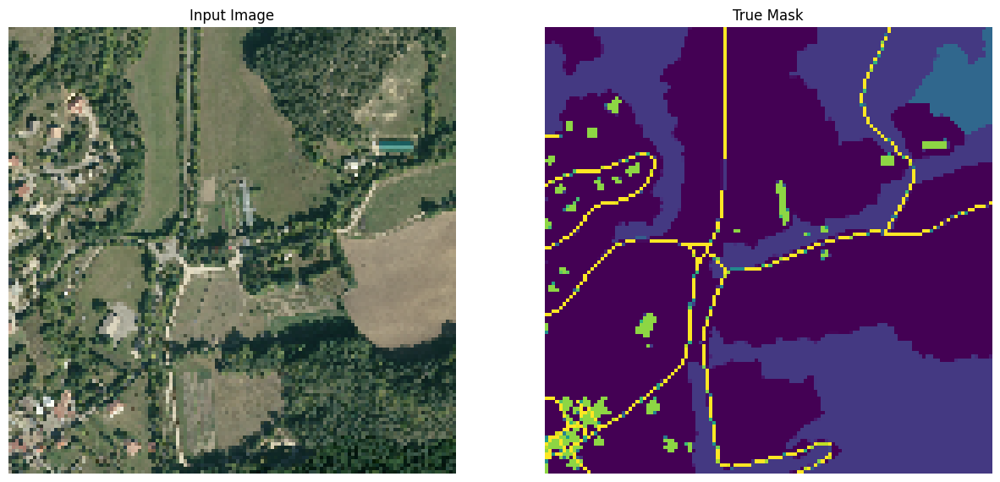



## Downloading the data

The data can be either downloaded from the link above and uploaded directly on Colab, or by running the following code snippet, that automatically downloads the data and unzip it.

In [ ]:
!gdown 1y73mUPzS5Hhq1RjPXc9bxch-Nv6HlJem
!unzip ign_dataset.zip
!rm ign_dataset.zip

## Multi-class segmentation

In this project, the input-target pair is composed by a $1000 \times 1000$ RGB image as visualized above, together with a $1000 \times 1000$ mask, that classifies each pixel by assigning to it a real number.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from PIL import Image
import tensorflow as tf
from tensorflow import keras as ks
import random
import cv2
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Activation, Dropout, Lambda
from tensorflow.keras.callbacks import EarlyStopping


2023-09-10 13:32:47.953581: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9346] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-09-10 13:32:47.953618: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-09-10 13:32:47.953631: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.


In [3]:
shape=(256, 256)

X_path = './ign/images/'
Y_path = './ign/annotations/'

train_name = sorted(os.listdir(os.path.join(X_path, 'training')))
test_name = sorted(os.listdir(os.path.join(X_path, 'validation')))

# As an example: load a sample to check the data
x_sample = plt.imread(os.path.join(X_path, 'training', train_name[10]))
y_sample = plt.imread(os.path.join(Y_path, 'training', train_name[10]))

print(f"Shape of x: {x_sample.shape}. Shape of y: {y_sample.shape}.")
print(f"Unique values of y: {np.unique(y_sample)}.")

Shape of x: (1000, 1000, 3). Shape of y: (1000, 1000).
Unique values of y: [0.         0.00392157 0.02352941].


In the example above, y_sample contains 3 classes, represented by the three unique real numbers [0, 0.00392157, 0.02352941].

Note that this approach is unusual in multiclass segmentation, where usually the mask is reshaped to be an $height \times width \times num. class$ binary array, where the pixel in position (i, j) is classified as the class associated to the value 1, among the channels.

In this project, we assume that your data is processed as described above, since the metric used for the evaluation is implemented this way.  

## Metrics
The comparison metric for this project is the Dice Cofficient for multi-class segmentation. To apply this function, you are required to reshape both the predicted mask and the true mask to shape (batch_size, h, w, num_classes), where num_classes is the number of segmentation classes.


In [4]:
def dice_coef(y_true, y_pred):
    y_true_f = tf.keras.layers.Flatten()(y_true)
    y_pred_f = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(2.0 * tf.cast(y_true_f, dtype=tf.float32) * tf.cast(y_pred_f, dtype=tf.float32))
    smooth = tf.constant(0.0001, dtype=tf.float32)
    return (intersection + smooth) / (tf.reduce_sum(tf.cast(y_true_f, dtype=tf.float32)) + tf.reduce_sum(tf.cast(y_pred_f, dtype=tf.float32)) + smooth)

def dice_coef_multilabel(y_true, y_pred, numLabels=7):
    dice=0
    for index in range(numLabels):
        dice += dice_coef(y_true[:,:,:,index], y_pred[:,:,:,index])
    return dice/numLabels

def dice_loss(y_true, y_pred, numLabels=7):
    return 1 - dice_coef_multilabel(y_true, y_pred, numLabels)


## Project implementation

In this segmentation project, I have utilized a training dataset comprising 600 images and their corresponding masks. Each image in the dataset originally had dimensions of 1000x1000x3. However, due to computational constraints, I resized these images to 256x256x3, allowing for more manageable processing.

The masks associated with each image were initially structured as 1000x1000 arrays, containing 7 distinct real values, with each value representing a different class. To make these masks compatible with my segmentation model and specifically with the dice_coef() function, I choice to transform them. Each mask was resized to match the resolution of the new 256x256 images, and the number of channels was expanded to 7. In this process, each channel contains binary values, either 1 or 0, effectively performing one-hot encoding on the masks. This transformation not only made the masks suitable for use with the dice_coef() function but also allowed for more effective and precise segmentation of the images, enhancing the overall performance of the model.

This approach enabled me to work within my computational capabilities while ensuring that both the images and masks were appropriately prepared for the segmentation task.

First of all, I have written some functions that I will use throughout the project.

In [5]:
#This function, given the root path and a list of file names as input, return
#the dataset array with images at lower resolution
def load_data_from_names(root_dir: str, fnames: list, shape = shape) -> np.array:
    images = []

    for idx, img_name in enumerate(fnames):
        x = Image.open(os.path.join(root_dir, img_name))

        x = cv2.resize(np.array(x), shape)

        x = np.array(x)

        images.append(x)
        if idx%100 == 99:
            print(f"Processed {idx+1} images.")
    return np.array(images)

In [6]:
#perform the one hot encoding of x
def one_hot_encoding(x):
    unique_values = np.unique(x)
    
    y = np.zeros(x.shape + (len(unique_values),), dtype=int)

    for i, value in enumerate(unique_values):
        y[(x == value),i] = 1
    print('new shape of y: ',y.shape)
    return y

In [7]:
#these functions print the images
def show2(x, y, title=None):
    #print two images
    plt.figure(figsize=(15, 8))

    plt.subplot(1, 2, 1)
    plt.imshow(x)
    if title:
        plt.title(title[0])

    plt.subplot(1, 2, 2)
    plt.imshow(y)
    if title:
        plt.title(title[1])

    plt.show()

def show3(x, y, z, title=None):
    #print 3 images
    plt.figure(figsize=(15, 8))

    plt.subplot(1, 3, 1)
    plt.imshow(x)
    if title:
        plt.title(title[0])

    plt.subplot(1, 3, 2)
    plt.imshow(y)
    if title:
        plt.title(title[1])

    plt.subplot(1, 3, 3)
    plt.imshow(z)
    if title:
        plt.title(title[2])

    plt.show()

Now, we can proceed to load the training data by utilizing the load_data_from_names() function.

In [8]:
X = load_data_from_names(os.path.join(X_path, 'training'), train_name)
print('Dataset X loaded\n')
y_temp = load_data_from_names(os.path.join(Y_path, 'training'), train_name)
print('Masks loaded')

Processed 100 images.
Processed 200 images.
Processed 300 images.
Processed 400 images.
Processed 500 images.
Processed 600 images.
Dataset X loaded

Processed 100 images.
Processed 200 images.
Processed 300 images.
Processed 400 images.
Processed 500 images.
Processed 600 images.
Masks loaded


At this stage, the program executes the one-hot encoding the masks. This process involves converting the multi-class masks into a binary representation suitable for our segmentation task.

In [9]:
#perform the one hot encoding of y
y=one_hot_encoding(y_temp)

new shape of y:  (600, 256, 256, 7)


# LinkNet
I have opted to implement a lightweight version of the LinkNet architecture for my semantic segmentation task. This choice is motivated by the principles outlined in the research [paper](https://arxiv.org/pdf/1707.03718.pdf), which highlights the network's capacity to deliver strong segmentation performance while minimizing the overall parameter count.

One noteworthy distinction in my network architecture is the design of the encoder block. In contrast to the standard configuration, which typically employs four convolutional layers and two residual connections, I have streamlined the encoder block in my implementation. It consists of just two convolutional layers and one residual connection. This modification is aimed at achieving effective segmentation and ensuring that my model does not exceed the constraint of 10 millions parameters.


encoder block structure:
```
          input
            |_______________
    conv 3x3 + BN + Relu    |
            |               |
        conv 3x3            |
            |_______________|
        BN + Relu
            |
          output
```
decoder block structure:
```
          input
            |
    conv 1x1 + BN + Relu
            |
    conv 3x3 + BN + Relu
            |
    conv 1x1 + BN + Relu
            |
          output
```
overall stucture of the network:
```
                                   output
         input                        |
           |                   conv 2x2 + Relu
    conv 3x3 + Relu                   |
    conv 3x3 + Relu       dropout + conv 3x3 + BN + Relu
  conv 3x3 + BN + Relu    dropout + conv 3x3 + BN + Relu
           |              dropout + conv 3x3 + BN + Relu
     MaxPooling 2x2       dropout + conv 3x3 + BN + Relu
           |                          |
        encoder 128               decoder 128
           |__________________________|
        encoder 256               decoder 256
           |__________________________|
        encoder 512               decoder 512
           |__________________________|
```

To enhance the model's generalization capabilities, I've incorporated dropout layers as a defense against overfitting. These dropout layers aid in preventing the model from becoming overly specialized to the training data.

Additionally, BatchNorm layers have been integrated into the model. They serve a dual purpose: not only do they enable the utilization of higher learning rates, but they also offer the advantage of achieving good performance even in scenarios where the initial configuration of the network may not be meticulously fine-tuned.


In [10]:
#here i define the encoder and decoder block, then the model

#the encoder consists of two 3x3 convolution followed by a residual connection
def encoder_block(input_tensor, num_filters, kernel_size=(3, 3), strides=(1, 1)):
    x = layers.Conv2D(num_filters, kernel_size, strides=strides, activation=None, padding='same')(input_tensor)#(2,2)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(num_filters, kernel_size, strides=strides, activation=None, padding='same')(x)

    # Add residual connection
    if input_tensor.shape[-1] != num_filters:
        input_tensor = layers.Conv2D(num_filters, (1, 1), strides=strides, padding='same')(input_tensor)
    x = layers.add([x, input_tensor])

    x = layers.BatchNormalization()(x)

    x = layers.ReLU()(x)

    return x

#the decoder consists of 3 convolutions: 1x1 -> 3x3 -> 1x1
def decoder_block(input_tensor, skip_tensor, num_filters):
    if skip_tensor ==None :
        x=input_tensor
    else:
        x = layers.concatenate([input_tensor, skip_tensor], axis=-1)

    x = layers.Conv2D(num_filters, (1, 1), strides=(1, 1), activation=None, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(num_filters, (3, 3), strides=(1, 1), activation=None, padding='same')(x)
    x = layers.UpSampling2D(size=(2,2), interpolation='bilinear')(x)

    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(num_filters, (1, 1), strides=(1, 1), activation=None, padding='valid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    return x

def LinkNet(input_shape, num_classes):
    dropout_rate=0.3
    inputs = tf.keras.Input(shape=input_shape)

    # Features extractor
    x = layers.Conv2D(64 ,(3,3), strides=(1,1), activation=None, padding='same')(inputs)
    x = layers.ReLU()(x)
    x = layers.Conv2D(128 ,(3,3), strides=(1,1), activation=None, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(128 ,(3,3), strides=(1,1), activation=None, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.MaxPooling2D((2,2))(x)

    # Encoder
    enc2 = encoder_block(x, 128)
    enc3 = layers.MaxPooling2D((2, 2))(enc2)

    enc3 = encoder_block(enc3, 256)
    enc4 = layers.MaxPooling2D((2, 2))(enc3)

    enc4 = encoder_block(enc4, 512)

    # Decoder
    dec4 = decoder_block(enc4,None, 512)
    dec3 = decoder_block(dec4, enc3, 256)
    dec2 = decoder_block(dec3, enc2, 128)

    # Classificator
    x = Dropout(rate=dropout_rate)(dec2)
    x = layers.Conv2D(128 ,(3,3), strides=(1,1), activation=None, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = Dropout(rate=dropout_rate)(x)
    x = layers.Conv2D(128 ,(3,3), strides=(1,1), activation=None, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = Dropout(rate=dropout_rate)(x)
    x = layers.Conv2D(128 ,(3,3), strides=(1,1), activation=None, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = Dropout(rate=dropout_rate)(x)
    x = layers.Conv2D(64 ,(3,3), strides=(1,1), activation=None, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(64 ,(2,2), strides=(1,1), activation=None, padding='same')(x)
    x = layers.ReLU()(x)

    # Output layer
    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax', padding='same')(x)

    model = tf.keras.Model(inputs, outputs)
    
    return model


Rather than adhering to a fixed learning rate throughout training, I have chosen to implement learning rate scheduling. This technique contributes to improved training stability and convergence. By gradually decreasing the learning rate as training progresses, the model can fine-tune its weights more effectively.

As for the loss function, I have opted for the Dice loss. This decision is grounded in extensive testing, where I observed that the Dice loss consistently delivers the best performance in the context of my project. The Dice loss, known for its suitability in segmentation tasks, aligns with the project's objectives and has proven to be an effective choice.

In [11]:
# Define input shape and number of classes
input_shape = (256, 256, 3)
num_classes = 7

# Define the learning rate scheduler
initial_learning_rate = 0.01
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate, decay_steps=1000, decay_rate=0.9, staircase=True
)

# Create and compile the model
LinkNet_model = LinkNet(input_shape, num_classes)
LinkNet_model.compile(optimizer=ks.optimizers.Adam(learning_rate=lr_schedule),
                  loss = dice_loss,
                  metrics=['accuracy', dice_coef_multilabel])

print(LinkNet_model.summary())

2023-09-10 13:34:05.846770: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-10 13:34:06.117995: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-10 13:34:06.118181: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 re_lu (ReLU)                (None, 256, 256, 64)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 128)        73856     ['re_lu[0][0]']               
                                                                                              

Network training

In [ ]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',         # Metric to monitor (you can use other metrics like 'val_accuracy')
    patience=50,                # Number of epochs with no improvement after which training will stop
    restore_best_weights=True   # Restore model weights from the epoch with the best value of the monitored metric
)

# Set hyperparameters
BATCH_SIZE = 16
N_EPOCHS = 300

# Training
hist = LinkNet_model.fit(X, y,
              batch_size=BATCH_SIZE,
              epochs=N_EPOCHS,
              validation_split=0.2,
              callbacks=[early_stopping] )

#Save network weights
LinkNet_model.save_weights('LinkNet.h5')

Epoch 1/300
30/30 [==============================] - 76s 400ms/step - loss: 0.7848 - accuracy: 0.5957 - dice_coef_multilabel: 0.2152 - val_loss: 0.9596 - val_accuracy: 0.1660 - val_dice_coef_multilabel: 0.0410
Epoch 2/300
30/30 [==============================] - 8s 281ms/step - loss: 0.7416 - accuracy: 0.6145 - dice_coef_multilabel: 0.2584 - val_loss: 0.9596 - val_accuracy: 0.1660 - val_dice_coef_multilabel: 0.0410
Epoch 3/300
30/30 [==============================] - 8s 280ms/step - loss: 0.7193 - accuracy: 0.6506 - dice_coef_multilabel: 0.2807 - val_loss: 0.9596 - val_accuracy: 0.1660 - val_dice_coef_multilabel: 0.0410
Epoch 4/300
30/30 [==============================] - 8s 281ms/step - loss: 0.6940 - accuracy: 0.6500 - dice_coef_multilabel: 0.3060 - val_loss: 0.9596 - val_accuracy: 0.1660 - val_dice_coef_multilabel: 0.0410
Epoch 5/300
30/30 [==============================] - 8s 281ms/step - loss: 0.6912 - accuracy: 0.6623 - dice_coef_multilabel: 0.3088 - val_loss: 0.8438 - val_accura

In [12]:
# Load weights
LinkNet_model.load_weights('LinkNet.h5')

Now we set up the historical variables, print training informations and informative graphs.

In [ ]:
# Define all history variables
loss_history = hist.history['loss']
val_loss_history = hist.history['val_loss']

acc_history = hist.history['accuracy']
val_acc_history = hist.history['val_accuracy']

dice_history = hist.history['dice_coef_multilabel']
val_dice_history = hist.history['val_dice_coef_multilabel']

Results of the training phase

at the end of training, on the train data we have:
	 train accuracy:  0.9498130679130554 
	 validation accuracy:  0.7693337798118591 
	 train loss:  0.21125587821006775 
	 validation loss:  0.5033267140388489 
	 train dice:  0.7887441515922546 
	 validation dice:  0.49561184644699097


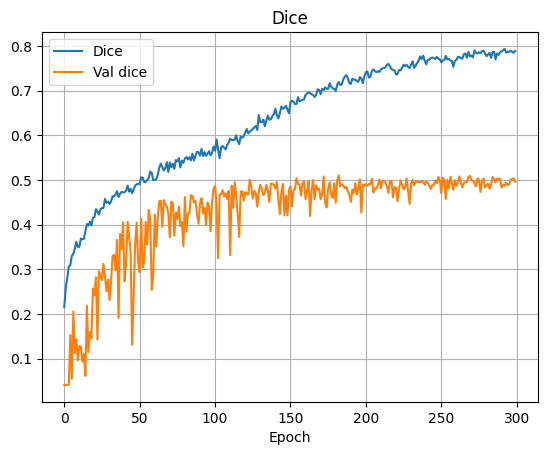

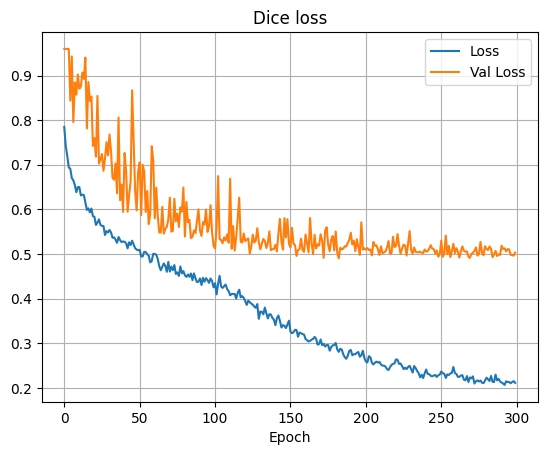

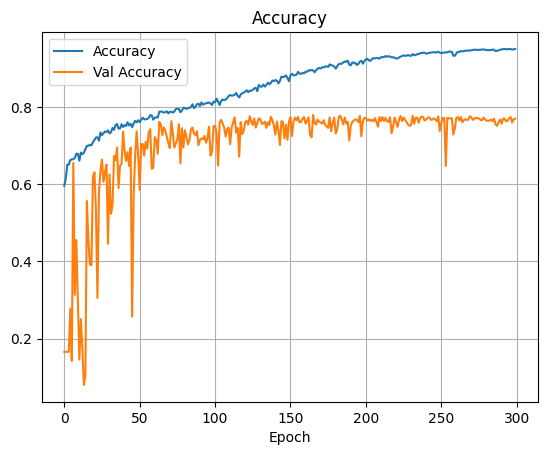

In [ ]:
# Print all history variables
loss_history = hist.history['loss']
val_loss_history = hist.history['val_loss']

acc_history = hist.history['accuracy']
val_acc_history = hist.history['val_accuracy']

dice_history = hist.history['dice_coef_multilabel']
val_dice_history = hist.history['val_dice_coef_multilabel']

print('at the end of training, on the train data we have:\n\t train accuracy: ',acc_history[-1],'\n\t validation accuracy: ', val_acc_history[-1],
      '\n\t train loss: ',loss_history[-1],'\n\t validation loss: ', val_loss_history[-1],
      '\n\t train dice: ', dice_history[-1],'\n\t validation dice: ', val_dice_history[-1])

plt.plot(dice_history)
plt.plot(val_dice_history)
plt.grid()
plt.xlabel('Epoch')
plt.legend(['Dice', 'Val dice'])
plt.title('Dice')
plt.show()

plt.plot(loss_history)
plt.plot(val_loss_history)
plt.grid()
plt.xlabel('Epoch')
plt.legend(['Loss', 'Val Loss'])
plt.title('Dice loss')
plt.show()

plt.plot(acc_history)
plt.plot(val_acc_history)
plt.grid()
plt.xlabel('Epoch')
plt.legend(['Accuracy', 'Val Accuracy'])
plt.title('Accuracy')
plt.show()


While my model doesn't exhibit clear signs of overfitting, as the validation performance remains stable, it's worth noting that the exceptionally high accuracy on the training data suggests that there may still be room for improvement in terms of generalization. This phenomenon is likely attributed to the benefits of batch normalization, dropout, and the lower learning rate achieved in the final epochs of training. In the meantime, I have set the maximum number of training epochs to 300 as a precautionary measure to prevent potentially deteriorating results.

# Predictions

## Train data
First, let's take a look at some of the predicted images on our training set. This will give us insights into how our model is performing on the data it was trained on and help us gauge its effectiveness in capturing training patterns.

In [13]:
# Predict some test data
y_pred = LinkNet_model.predict(X[0:15])

2023-09-10 13:34:37.055995: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8904
2023-09-10 13:34:39.643406: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.23GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-10 13:34:39.643762: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.23GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-10 13:34:43.720328: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 6.82GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if m

1/1 [==============================] - 9s 9s/step


image n.  0 	  c0_0915_6395.png


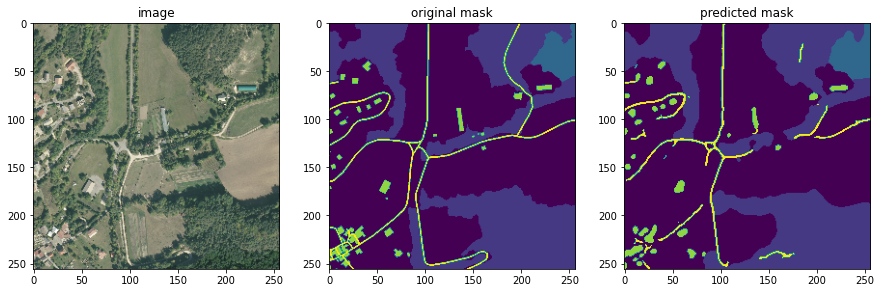

image n.  1 	  c0_0920_6390.png


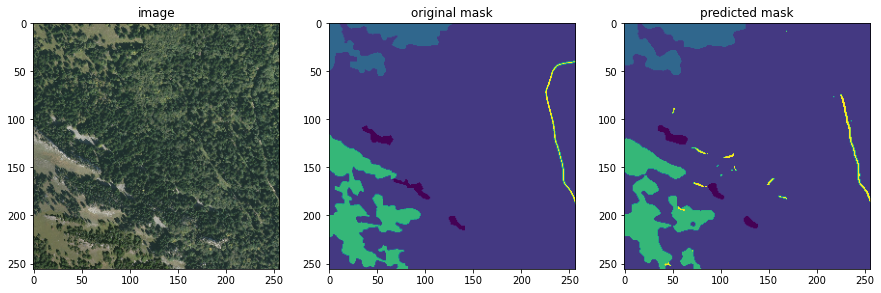

image n.  2 	  c0_0935_6390.png


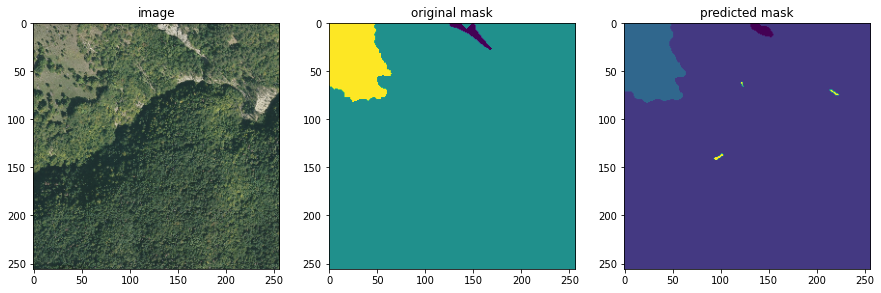

image n.  3 	  c0_0935_6400.png


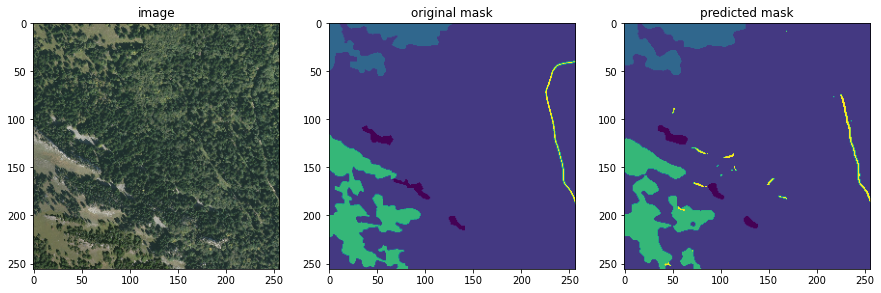

image n.  4 	  c0_0955_6380.png


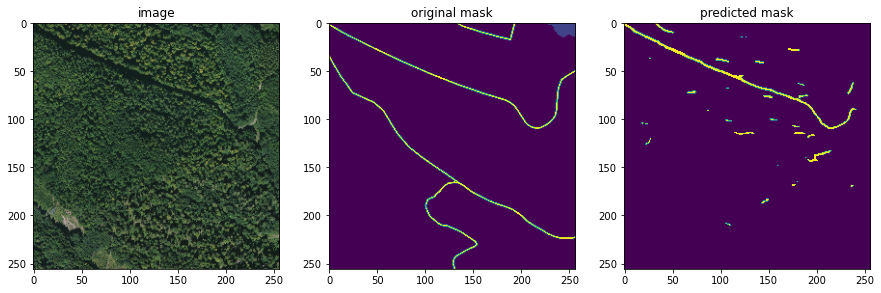

image n.  5 	  c0_0960_6390.png


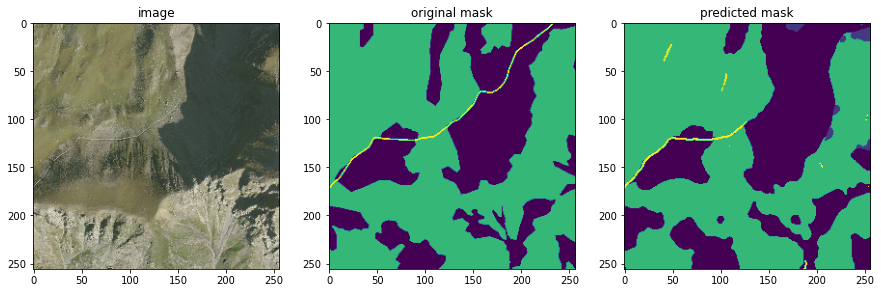

image n.  6 	  c0_0975_6425.png


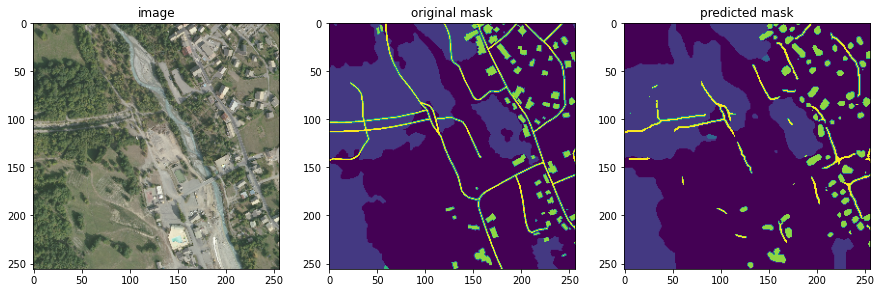

image n.  7 	  c0_0990_6405.png


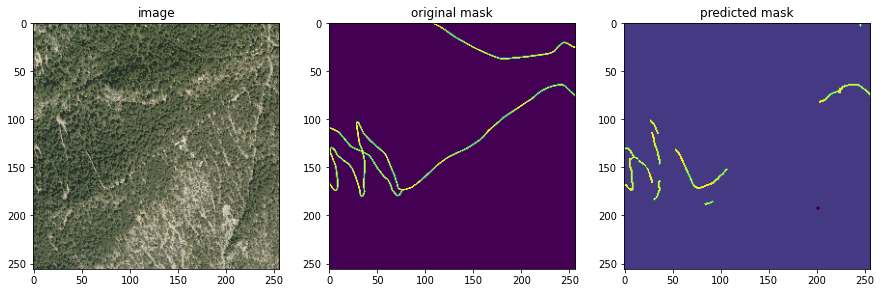

image n.  8 	  c10_0915_6395.png


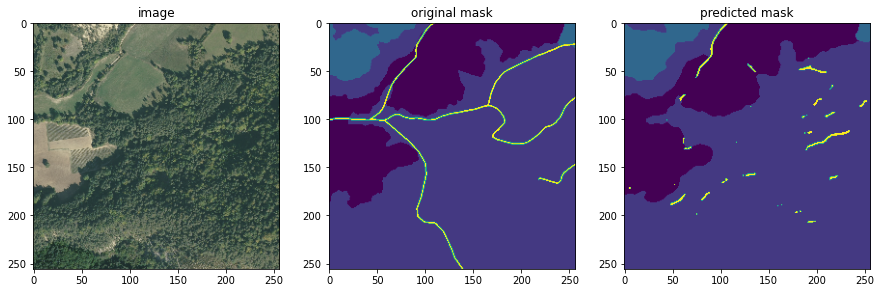

image n.  9 	  c10_0920_6390.png


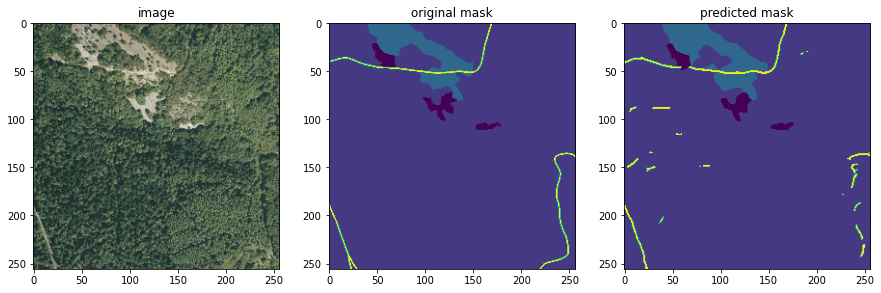

image n.  10 	  c10_0935_6390.png


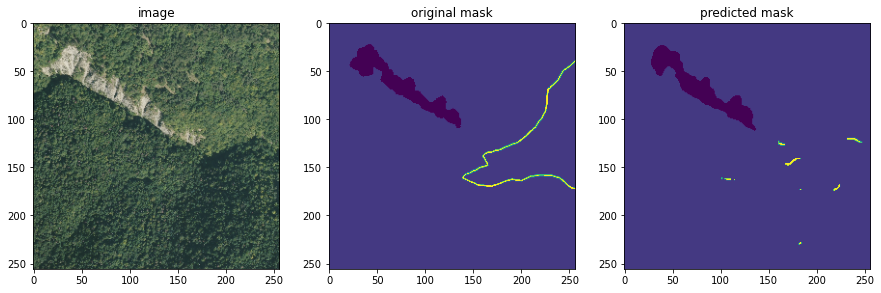

image n.  11 	  c10_0935_6400.png


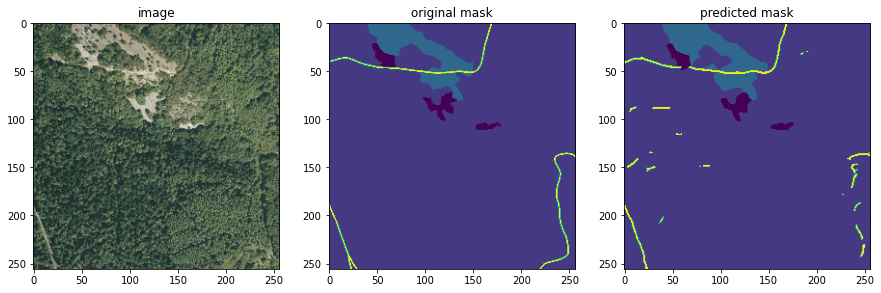

image n.  12 	  c10_0955_6380.png


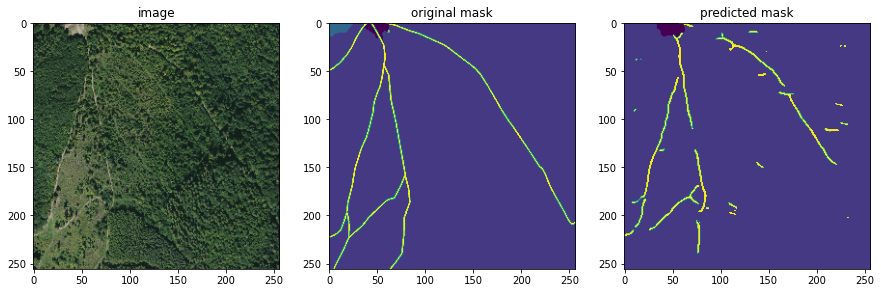

image n.  13 	  c10_0960_6390.png


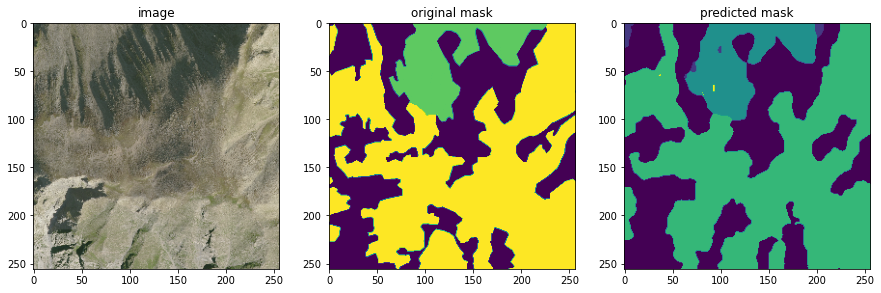

image n.  14 	  c10_0975_6425.png


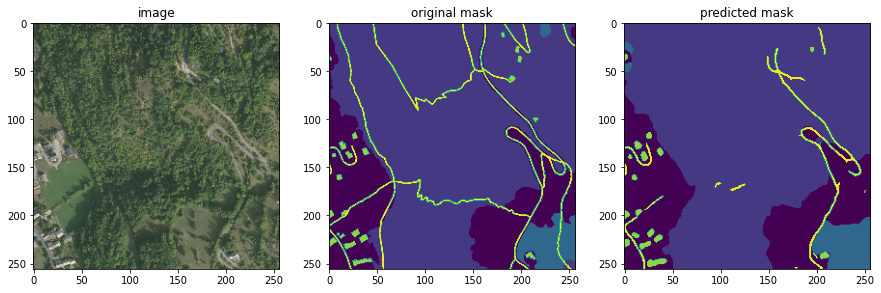

In [14]:
# the argmax is needed in order to obtain an array that contains values in the range [0,6]
for n in range(0,15):
    a=y_pred[n]
    original_shape = a.shape[:-1]
    print('image n. ',n,'\t ',train_name[n])
    show3(X[n], np.argmax(y[n], axis=-1).reshape(original_shape), np.argmax(a, axis=-1).reshape(original_shape),['image','original mask','predicted mask'])

## Test data
Now, let's assess the performance of our network on the test data.

In [15]:
# Load test data
X_test = load_data_from_names(os.path.join(X_path, 'validation'), test_name)
print('X_test loaded\n')
y_test_temp = load_data_from_names(os.path.join(Y_path, 'validation'), test_name)
print('y_test loaded')

Processed 100 images.
Processed 200 images.
X_test loaded

Processed 100 images.
Processed 200 images.
y_test loaded


Next, proceed to transform the true masks into one-hot encoded masks.

In [16]:
# One hot encoding of the masks
y_test = one_hot_encoding(y_test_temp)

new shape of y:  (200, 256, 256, 7)


Now, let's proceed to predict the test data.

In [17]:
batch=16
y_test_pred_tmp=[]
for i in range(0, X_test.shape[0], batch):
    batch_pred=LinkNet_model.predict(X_test[i:i+batch])
    y_test_pred_tmp.extend(batch_pred)

2023-09-10 13:35:23.878616: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.52GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-10 13:35:23.878654: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.52GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-10 13:35:25.303766: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.33GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-10 13:35:27.670246: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU

1/1 [==============================] - 6s 6s/step


##### Transform the predicted test data into one hot encoded data.
Now it converts the predicted test data into one-hot encoded format. Given that the predicted 'y' values fall within the [0, 1] range, it perform a transformation on each pixel. For every pixel, it will set the channel with the highest value to 1, while the other six channels will be set to 0. This process effectively assigns each pixel to one of the seven distinct classes. To illustrate, consider a simple example with two channels for a single pixel:

```
    [[0.1],[0.2]] -one-hot-encoding-> [[0],[1]]
```


In [34]:
y_test_pred=[]
for i in range(len(y_test_pred_tmp)):
    # Create a binary array with the same shape as y_test_pred_tmp
    max_channel_values = np.max(y_test_pred_tmp[i], axis=-1, keepdims=True)

    binary_array = np.where(y_test_pred_tmp[i] == max_channel_values, 1, 0)
    y_test_pred.append(binary_array)
y_test_pred = np.stack(y_test_pred, axis=0)

print('The predicted data now contains only ', np.unique(y_test_pred),' values')

The predicted data now contains only  [0 1]  values


Now, let's take a look at some of the predicted masks.

Image n.  0 	  c11_0915_6395.png


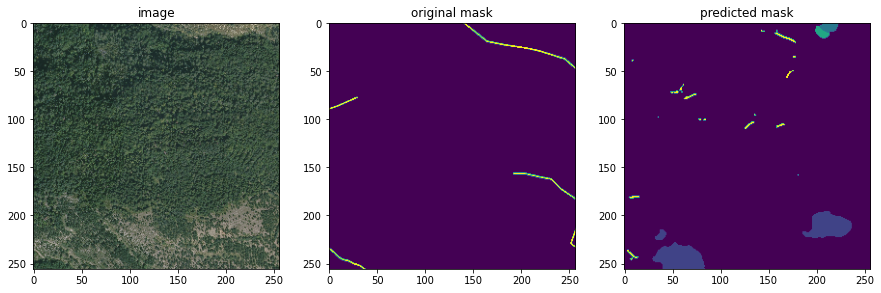

Image n.  6 	  c11_0975_6425.png


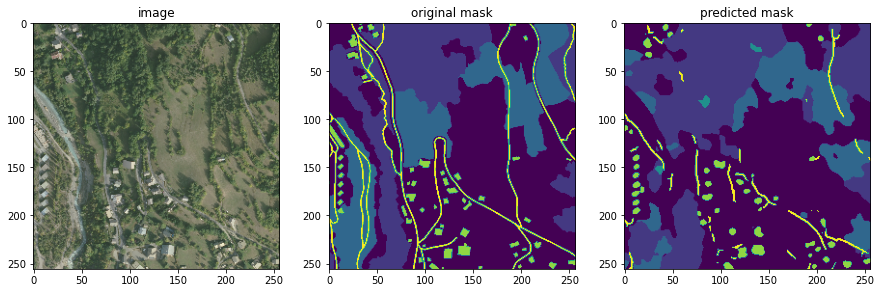

Image n.  12 	  c15_0955_6380.png


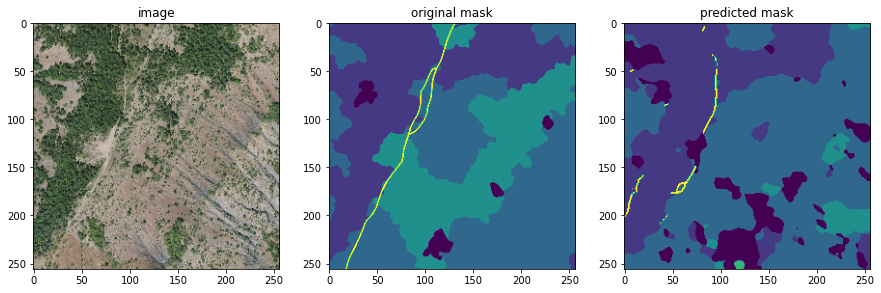

Image n.  18 	  c19_0935_6390.png


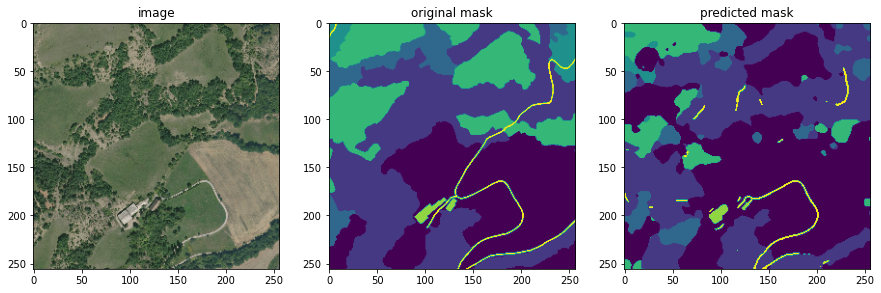

Image n.  24 	  c23_0915_6395.png


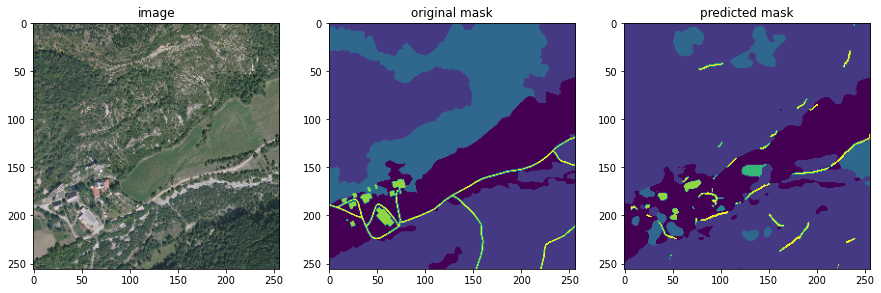

Image n.  30 	  c23_0975_6425.png


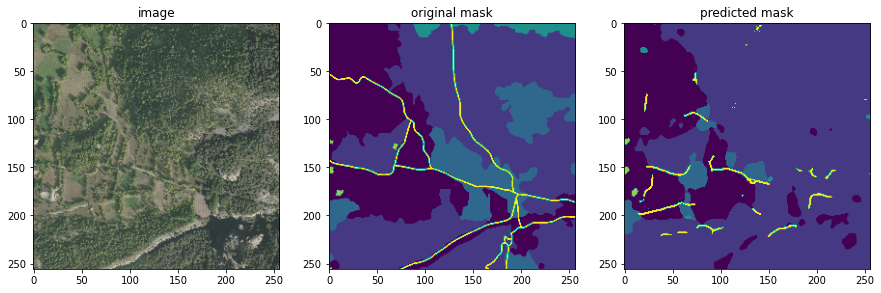

Image n.  36 	  c27_0955_6380.png


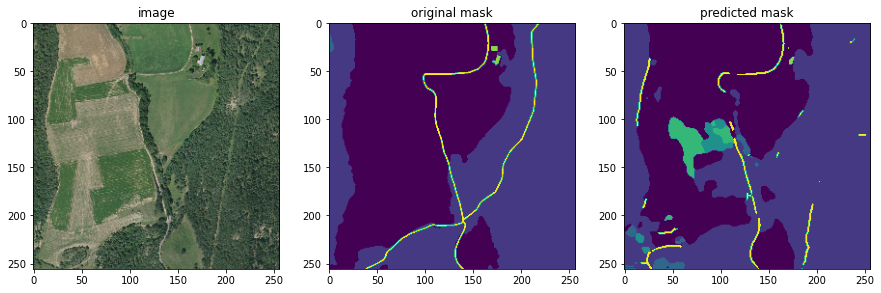

Image n.  42 	  c31_0935_6390.png


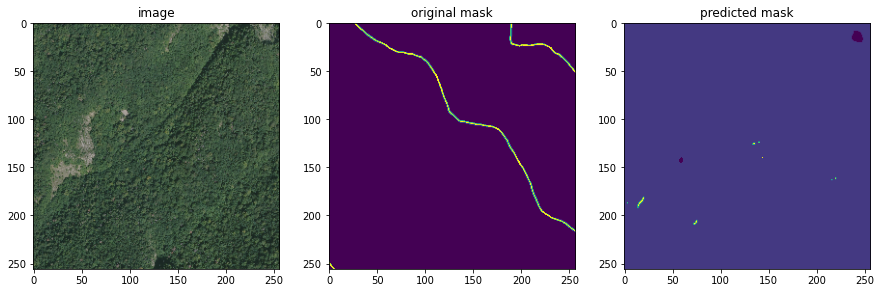

Image n.  48 	  c35_0915_6395.png


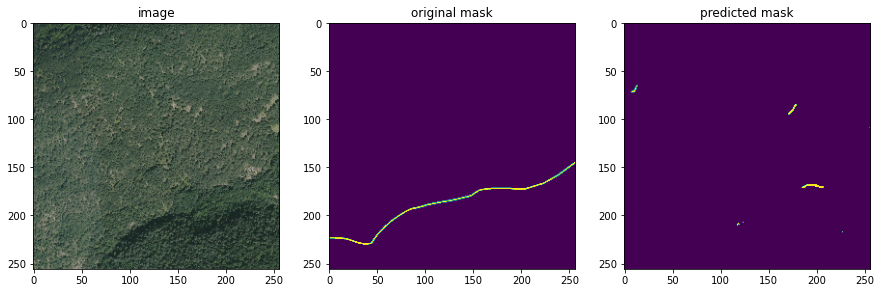

Image n.  54 	  c35_0975_6425.png


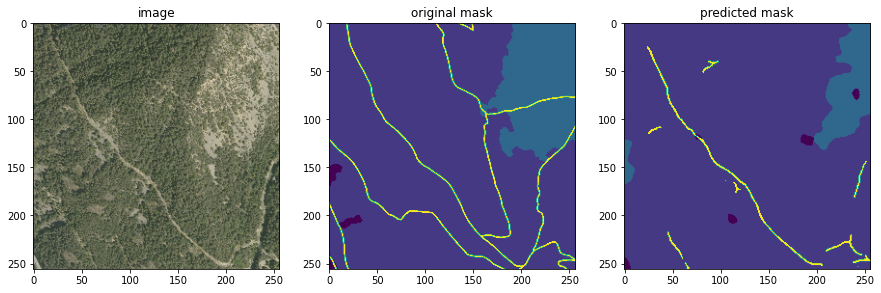

Image n.  60 	  c39_0955_6380.png


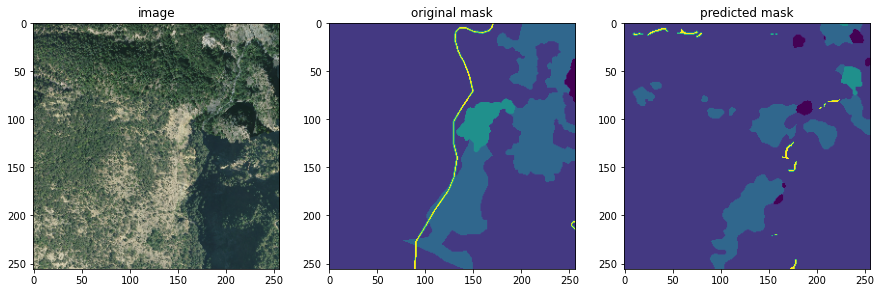

Image n.  66 	  c3_0935_6390.png


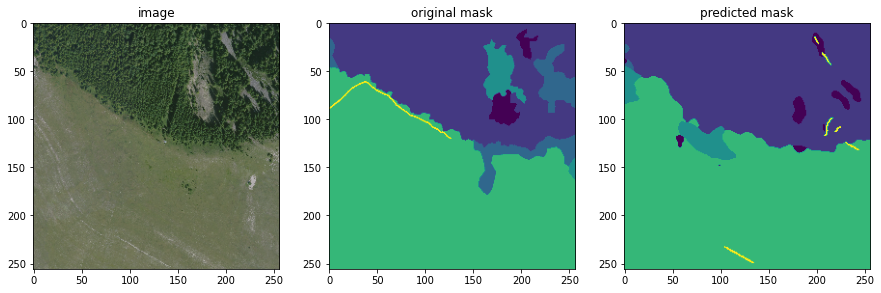

Image n.  72 	  c43_0915_6395.png


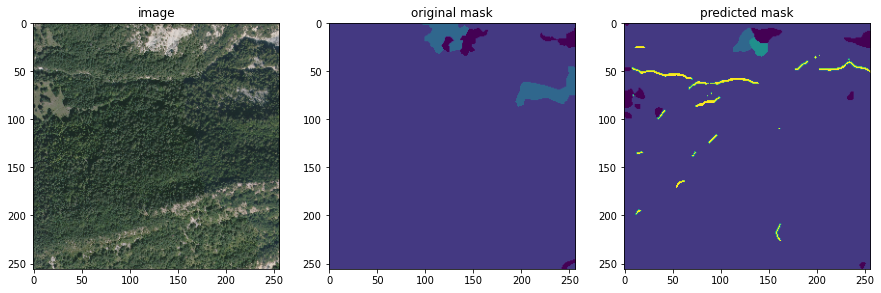

Image n.  78 	  c43_0975_6425.png


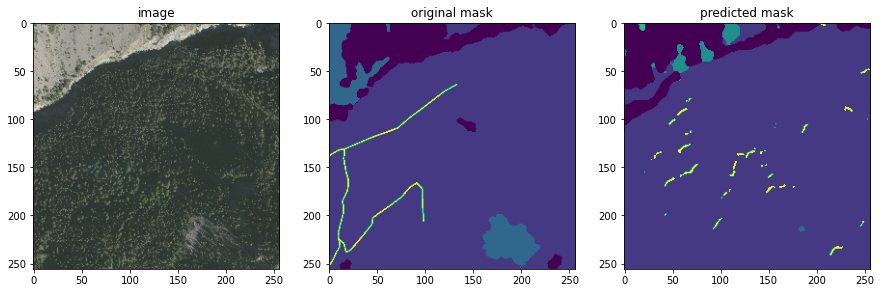

Image n.  84 	  c47_0955_6380.png


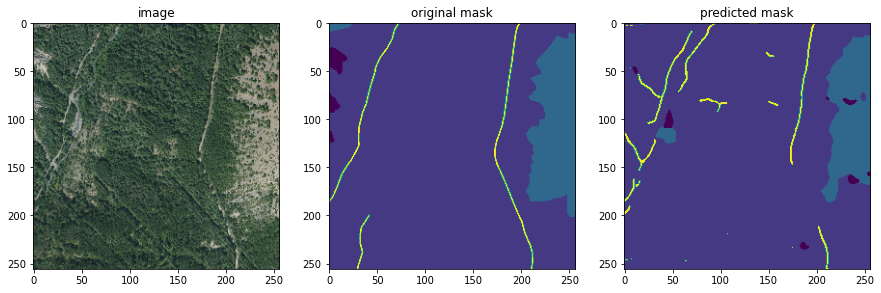

In [19]:
# the argmax is needed in order to obtain an array that contains values in the range [0,6]
for n in range(0,15):
    a=y_test_pred[n*6]
    original_shape = a.shape[:-1]
    print('Image n. ',n*6,'\t ',test_name[n*6])
    show3(X_test[n*6], np.argmax(y_test[n*6], axis=-1).reshape(original_shape), np.argmax(a, axis=-1).reshape(original_shape),['image','original mask','predicted mask'])

Now, let's assess the model's performance on the test data by calculating the Dice coefficient.

In [20]:
print('The dice coefficient on test data is: ',dice_coef_multilabel(y_test,y_test_pred,7).numpy())

The dice coefficient on test data is:  0.54426616


We could potentially achieve better results with a more balanced dataset. For example classes 5 (houses) and 6 (roads) pose challenges as there are limited examples of these classes in the training set. Below, you'll find a histogram illustrating the distribution of pixels for each class over the training set.

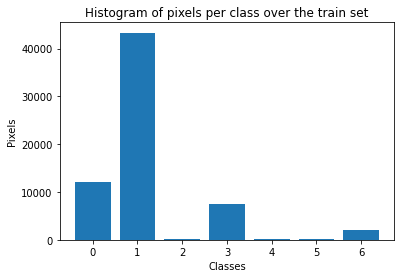

In [21]:
for i in range(len(y)):
    unique_values, counts = np.unique(np.argmax(y[i], axis=-1), return_counts=True)

plt.bar(unique_values, counts)
plt.xlabel('Classes')
plt.ylabel('Pixels')
plt.title('Histogram of pixels per class over the train set')
plt.show()

We can try to improve the network results my means of data augmenting and fine tuning

### Data augmentation
I plan to create a new dataset exclusively comprising images containing classes 2, 4, 5, and 6. Subsequently, I intend to apply rotation transformations to these images to further diversify the dataset and improve the model's ability to generalize.

One issue I have encountered is the presence of masks that, while containing all classes, have an exceptionally low pixel count, likely due to noise. To mitigate this, I plan to implement a threshold for each class pixels, beyond which these masks will be considered acceptable for further analysis.

In [22]:
from collections import Counter
# Image filter, it returns true only in the count of pixels belonging to certain classes exceed a given threshold
def class_filter(y):
    thresholds={2:800, 4:800, 5:700, 6:600}

    img=np.argmax(y, axis=-1)
    unique = np.unique(img)
    counter = Counter(img.flatten())

    filtered_list = [x for x in unique if x not in [0,1,3]]

    return any([counter[i] >= thresholds[i] for i in filtered_list])


Some removed images

Some removed images
Image n.  10


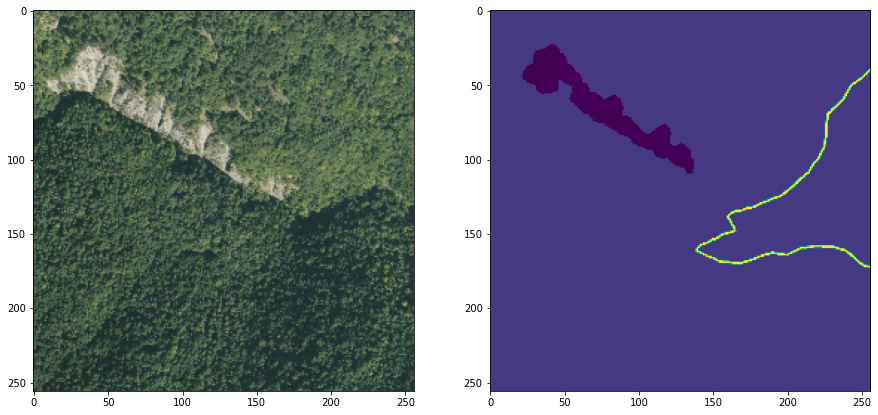

Image n.  32


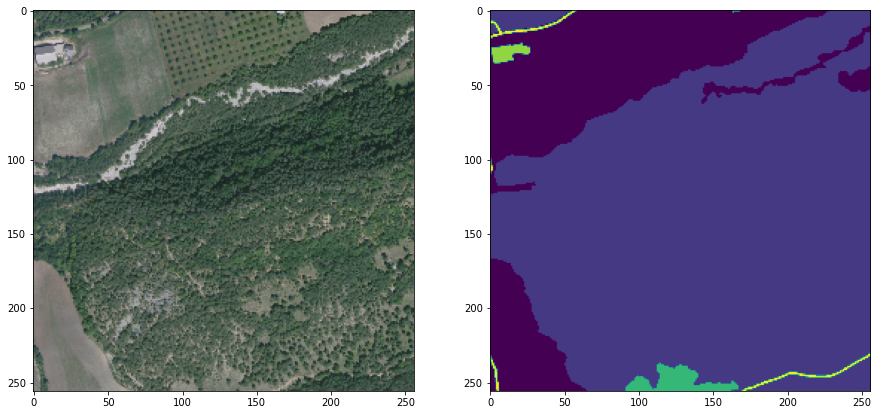

Image n.  63


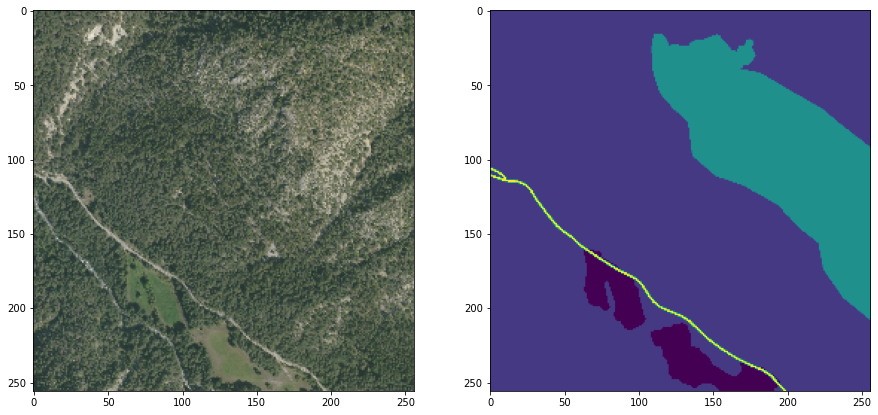

Image n.  66


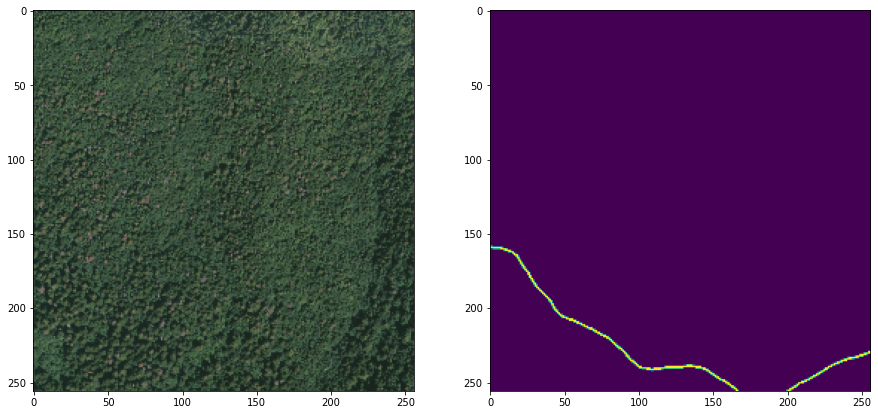

Image n.  97


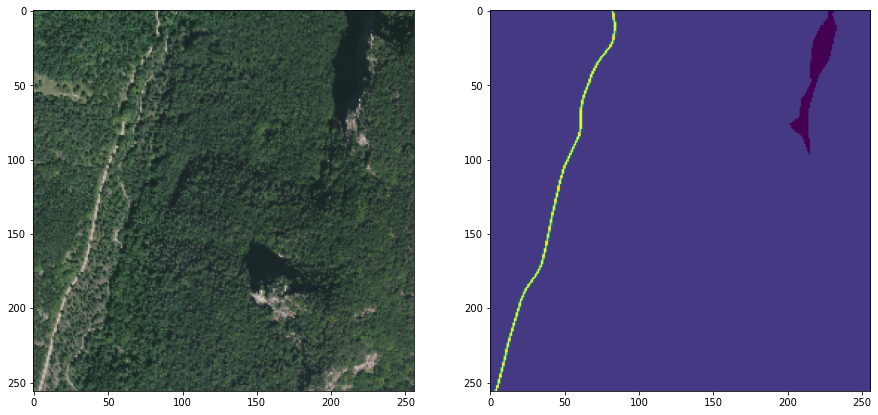

Image n.  98


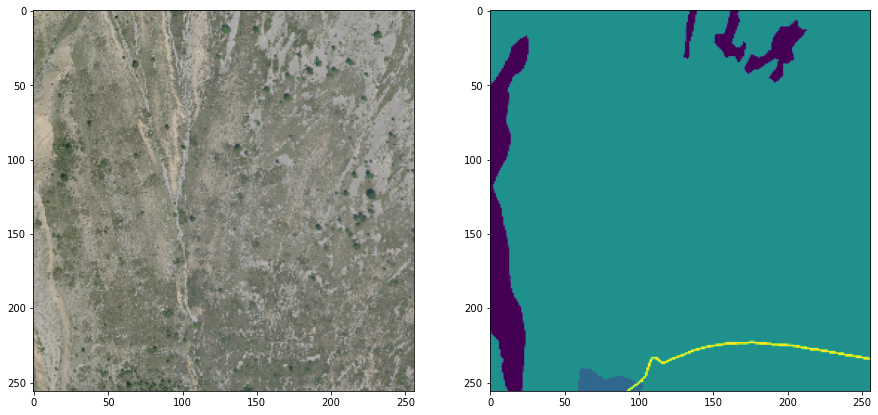

Image n.  99


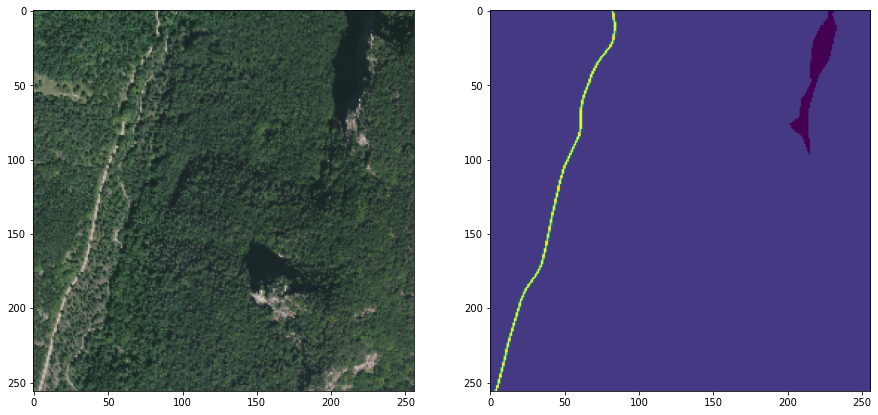

In [ ]:
# Some removed images
print('Some removed images')
for n in range(0,100):
    if not class_filter(y[n]):
        print('Image n. ', n)
        show2(X[n],np.argmax(y[n], axis=-1))

In [23]:
mask = [class_filter(y[n]) for n in range(y.shape[0])]
print('The filter has removed ',Counter(mask)[False], ' images from the original dataset')

The filter has removed  29  images from the original dataset


Create the new dataset

In [24]:
X_new=X[mask]
y_new=y[mask]

At this point we want to rotate the images and the masks

In [25]:
def rotate_image_array(image_array):

    def rotate_single_image(image):
        pil_image = Image.fromarray(image)
        rotated_pil_image = pil_image.rotate(180, expand=True)
        return np.array(rotated_pil_image)

    # Create an empty array to store rotated images
    num_images = image_array.shape[0]
    rotated_images = np.empty_like(image_array)

    # Apply the rotation function to each image in the batch
    for i in range(num_images):
        rotated_images[i] = rotate_single_image(image_array[i])

    return rotated_images

def rotate_masks(image_array):
    num_images = image_array.shape[0]
    rotated_images = np.empty_like(image_array, dtype=np.uint8)

    for i in range(num_images):
        for j in range(7):
            pil_image = Image.fromarray(image_array[i, :, :, j].astype(np.uint8))
            rotated_pil_image = pil_image.rotate(180, expand=True)
            rotated_images[i, :, :, j] = np.array(rotated_pil_image)

    return rotated_images



In [26]:
# Rotate the new trainset
X_rot = rotate_image_array(X_new)
y_rot = rotate_masks(y_new)

### Fine tuning

In [27]:
# Define the new learning rate scheduler
# Note that the initial learning rate now is smaller than the previous one because now we are doing fine tuning

input_shape = (256, 256, 3)
num_classes = 7

initial_learning_rate = 1e-4 # Initial learning rate that will be smaller at each ephoc
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate, decay_steps=1000, decay_rate=0.9, staircase=True
)

# Create and compile the model
LinkNet_model = LinkNet(input_shape, num_classes)
LinkNet_model.compile(optimizer=ks.optimizers.Adam(learning_rate=lr_schedule),
                  loss = dice_loss,
                  metrics=['accuracy', dice_coef_multilabel])

print(LinkNet_model.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, 256, 256, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 re_lu_23 (ReLU)             (None, 256, 256, 64)         0         ['conv2d_26[0][0]']           
                                                                                                  
 conv2d_27 (Conv2D)          (None, 256, 256, 128)        73856     ['re_lu_23[0][0]']            
                                                                                            

In [17]:
LinkNet_model.load_weights('LinkNet.h5')

In [18]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',         # Metric to monitor (you can use other metrics like 'val_accuracy')
    patience=30,                # Number of epochs with no improvement after which training will stop
    restore_best_weights=True   # Restore model weights from the epoch with the best value of the monitored metric
)

# Set hyperparameters
BATCH_SIZE = 16 # 4
N_EPOCHS = 120

# Training
hist = LinkNet_model.fit(X_rot, y_rot,
              batch_size=BATCH_SIZE,
              epochs=N_EPOCHS,
              validation_split=0.2,
              callbacks=[early_stopping] )

#Save network weights
LinkNet_model.save_weights('FinetunedLinkNet.h5')

Epoch 1/120
29/29 [==============================] - 91s 945ms/step - loss: 0.5104 - accuracy: 0.7678 - dice_coef_multilabel: 0.4893 - val_loss: 0.5438 - val_accuracy: 0.7267 - val_dice_coef_multilabel: 0.4429
Epoch 2/120
29/29 [==============================] - 8s 263ms/step - loss: 0.5024 - accuracy: 0.7703 - dice_coef_multilabel: 0.4977 - val_loss: 0.5354 - val_accuracy: 0.7307 - val_dice_coef_multilabel: 0.4507
Epoch 3/120
29/29 [==============================] - 8s 263ms/step - loss: 0.4934 - accuracy: 0.7747 - dice_coef_multilabel: 0.5060 - val_loss: 0.5295 - val_accuracy: 0.7337 - val_dice_coef_multilabel: 0.4564
Epoch 4/120
29/29 [==============================] - 8s 263ms/step - loss: 0.4927 - accuracy: 0.7782 - dice_coef_multilabel: 0.5073 - val_loss: 0.5252 - val_accuracy: 0.7360 - val_dice_coef_multilabel: 0.4605
Epoch 5/120
29/29 [==============================] - 8s 263ms/step - loss: 0.5004 - accuracy: 0.7784 - dice_coef_multilabel: 0.4985 - val_loss: 0.5224 - val_accura

In [28]:
# Load weights
LinkNet_model.load_weights('FinetunedLinkNet.h5')

Now we set up the historical variables, print training informations and informative graphs.

In [19]:
# Define all history variables
loss_history = hist.history['loss']
val_loss_history = hist.history['val_loss']

acc_history = hist.history['accuracy']
val_acc_history = hist.history['val_accuracy']

dice_history = hist.history['dice_coef_multilabel']
val_dice_history = hist.history['val_dice_coef_multilabel']

Results of the training phase

at the end of training, on the train data we have:
	 train accuracy:  0.8378679752349854 
	 validation accuracy:  0.7580718994140625 
	 train loss:  0.3868064880371094 
	 validation loss:  0.4912031292915344 
	 train dice:  0.6105121374130249 
	 validation dice:  0.49609723687171936


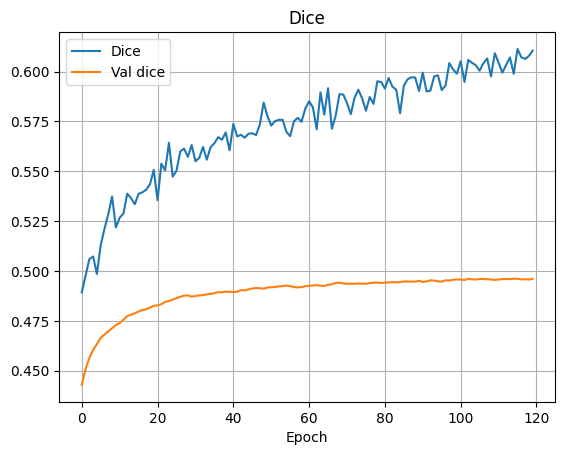

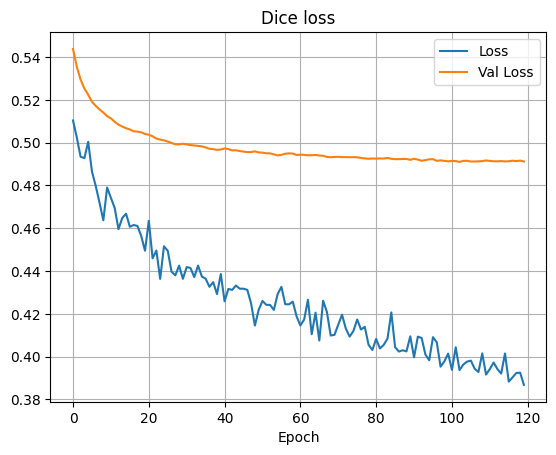

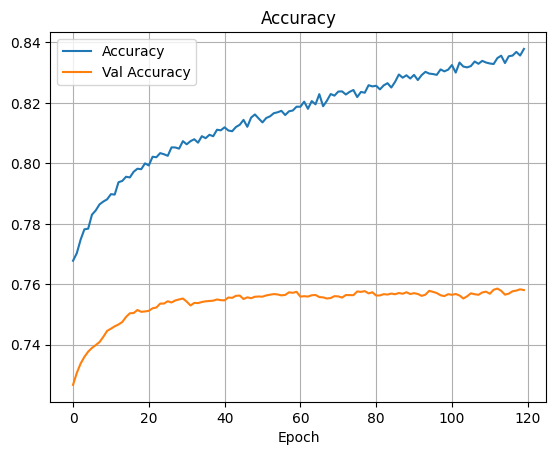

In [20]:

loss_history = hist.history['loss']
val_loss_history = hist.history['val_loss']

acc_history = hist.history['accuracy']
val_acc_history = hist.history['val_accuracy']

dice_history = hist.history['dice_coef_multilabel']
val_dice_history = hist.history['val_dice_coef_multilabel']

print('at the end of training, on the train data we have:\n\t train accuracy: ',acc_history[-1],'\n\t validation accuracy: ', val_acc_history[-1],
      '\n\t train loss: ',loss_history[-1],'\n\t validation loss: ', val_loss_history[-1],
      '\n\t train dice: ', dice_history[-1],'\n\t validation dice: ', val_dice_history[-1])

plt.plot(dice_history)
plt.plot(val_dice_history)
plt.grid()
plt.xlabel('Epoch')
plt.legend(['Dice', 'Val dice'])
plt.title('Dice')
plt.show()

plt.plot(loss_history)
plt.plot(val_loss_history)
plt.grid()
plt.xlabel('Epoch')
plt.legend(['Loss', 'Val Loss'])
plt.title('Dice loss')
plt.show()

plt.plot(acc_history)
plt.plot(val_acc_history)
plt.grid()
plt.xlabel('Epoch')
plt.legend(['Accuracy', 'Val Accuracy'])
plt.title('Accuracy')
plt.show()


## New results on test data

Now, let's proceed to predict the test data.

In [29]:
batch=16
y_test_pred_tmp=[]
for i in range(0, X_test.shape[0], batch):
    batch_pred=LinkNet_model.predict(X_test[i:i+batch])
    y_test_pred_tmp.extend(batch_pred)

1/1 [==============================] - 0s 15ms/step


Transform the predicted test data into one hot encoded data.

In [35]:
y_test_pred=[]
for i in range(len(y_test_pred_tmp)):
    # Create a binary array with the same shape as y_test_pred_tmp
    max_channel_values = np.max(y_test_pred_tmp[i], axis=-1, keepdims=True)

    binary_array = np.where(y_test_pred_tmp[i] == max_channel_values, 1, 0)
    y_test_pred.append(binary_array)
y_test_pred = np.stack(y_test_pred, axis=0)

print('The predicted data now contains only ', np.unique(y_test_pred),' values')

The predicted data now contains only  [0 1]  values


Now, let's take a look at some of the predicted masks.

Image n.  0 	  c11_0915_6395.png


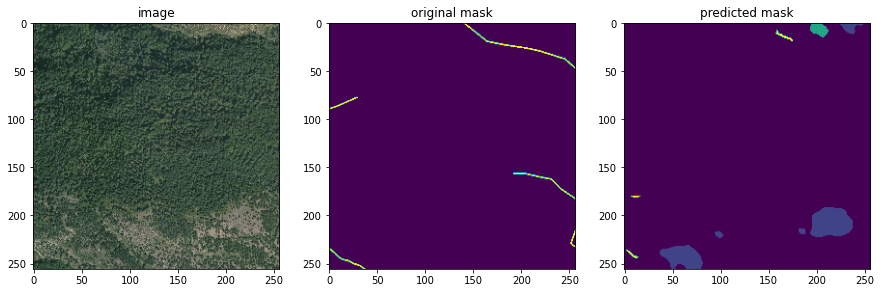

Image n.  6 	  c11_0975_6425.png


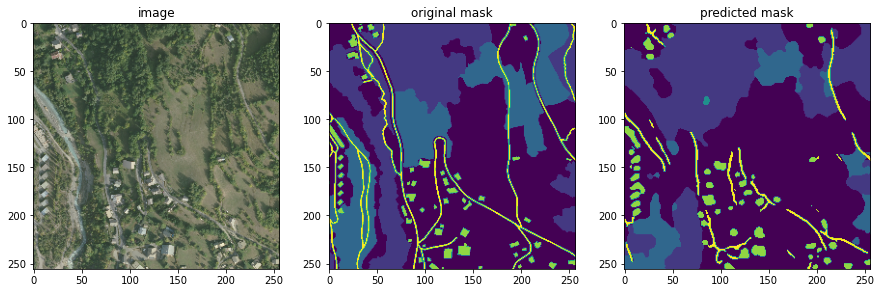

Image n.  12 	  c15_0955_6380.png


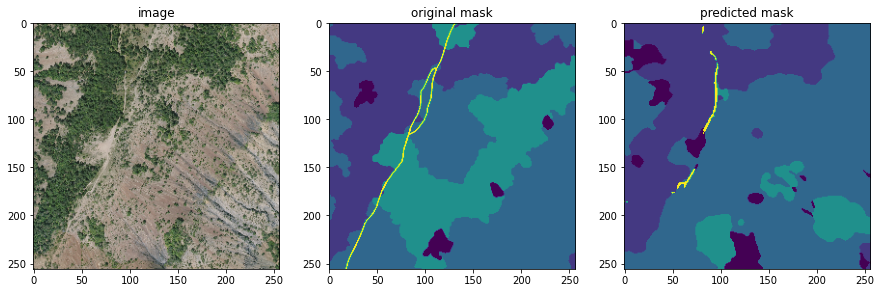

Image n.  18 	  c19_0935_6390.png


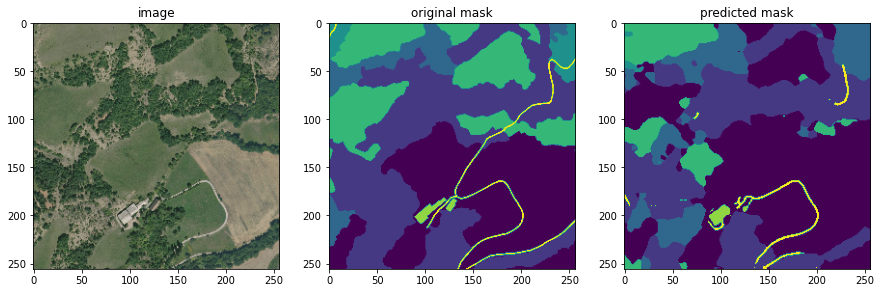

Image n.  24 	  c23_0915_6395.png


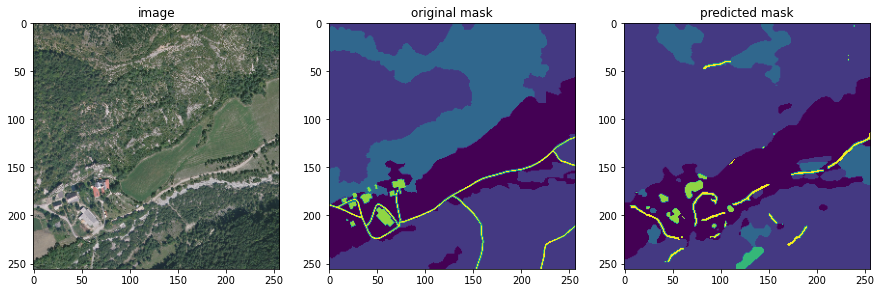

Image n.  30 	  c23_0975_6425.png


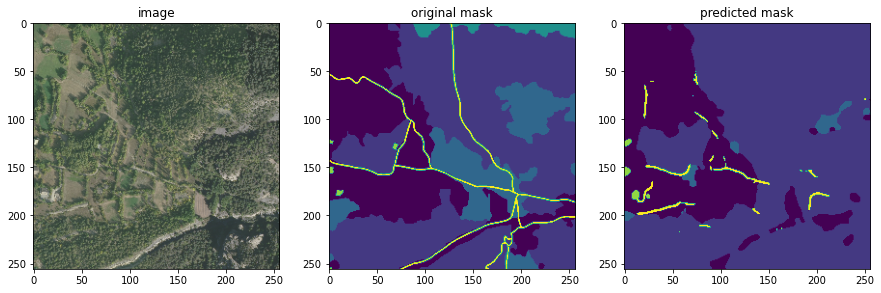

Image n.  36 	  c27_0955_6380.png


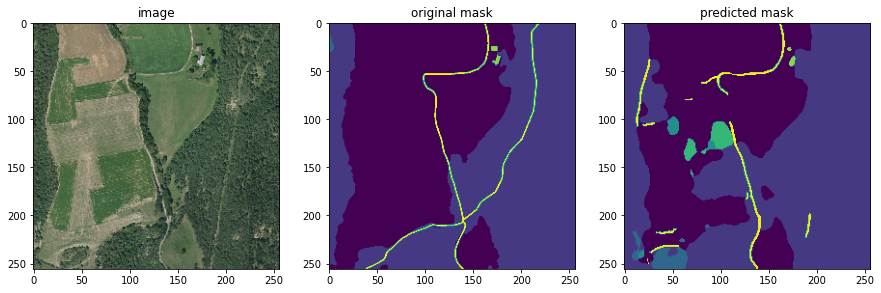

Image n.  42 	  c31_0935_6390.png


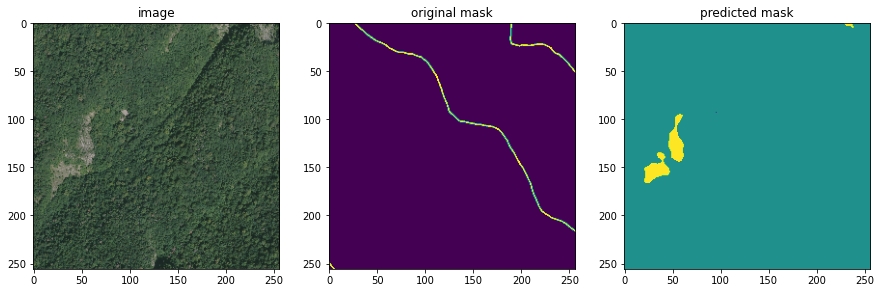

Image n.  48 	  c35_0915_6395.png


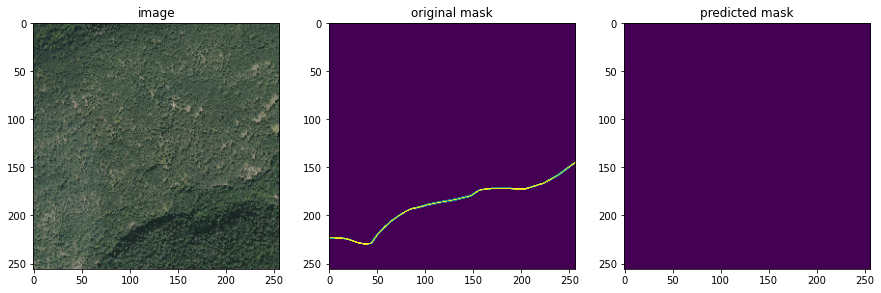

Image n.  54 	  c35_0975_6425.png


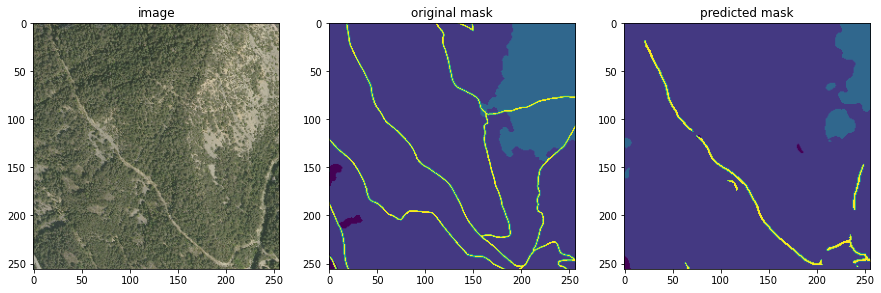

Image n.  60 	  c39_0955_6380.png


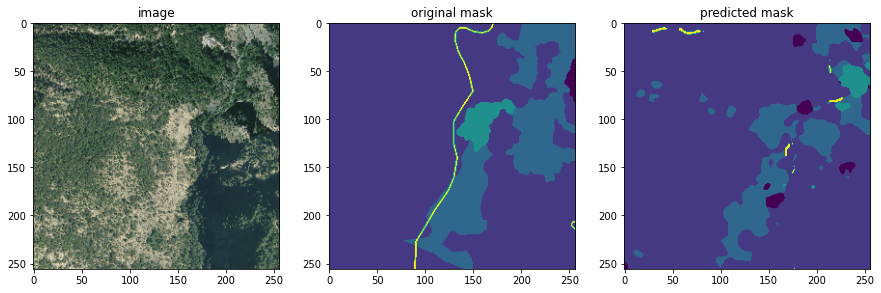

Image n.  66 	  c3_0935_6390.png


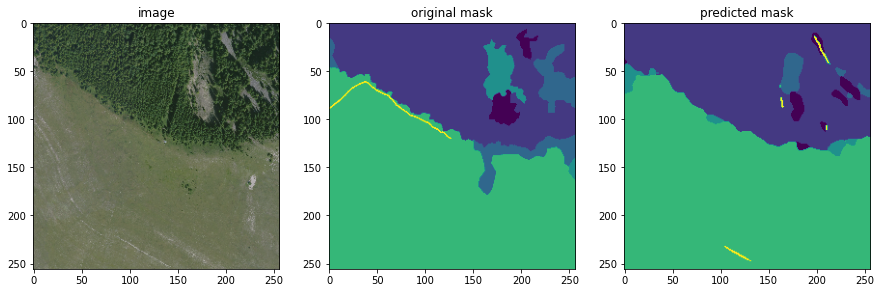

Image n.  72 	  c43_0915_6395.png


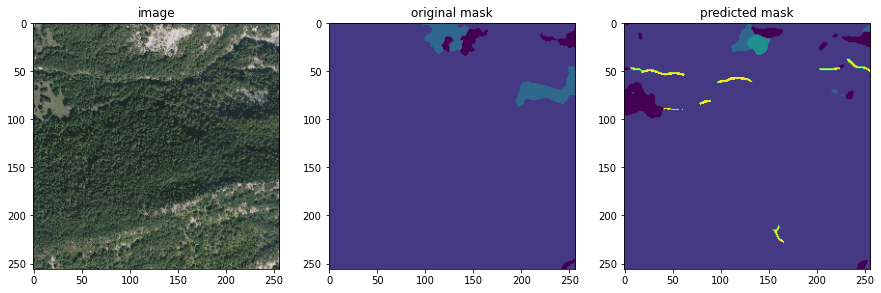

Image n.  78 	  c43_0975_6425.png


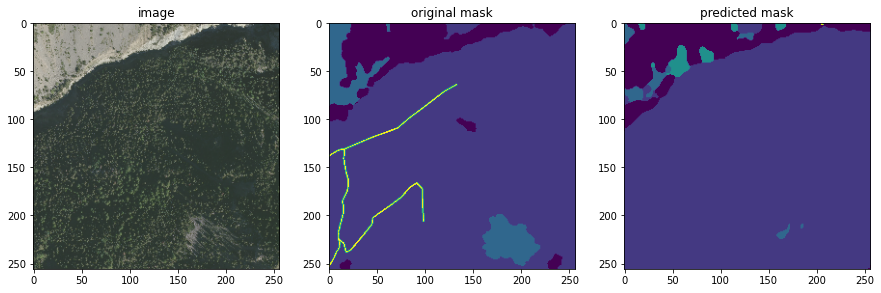

Image n.  84 	  c47_0955_6380.png


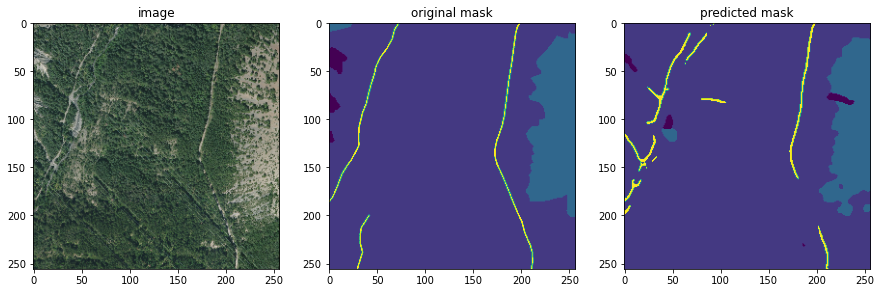

In [31]:
# the argmax is needed in order to obtain an array that contains values in the range [0,6]
for n in range(0,15):
    a=y_test_pred[n*6]
    original_shape = a.shape[:-1]
    print('Image n. ',n*6,'\t ',test_name[n*6])
    show3(X_test[n*6], np.argmax(y_test[n*6], axis=-1).reshape(original_shape), np.argmax(a, axis=-1).reshape(original_shape),['image','original mask','predicted mask'])

Now, let's assess the model's performance on the test data by calculating the final Dice coefficient.

In [33]:
print('The final dice coefficient on test data is: ',dice_coef_multilabel(y_test,y_test_pred,7).numpy())

The final dice coefficient on test data is:  0.5772094


## Conclusions
### Dice coefficient = 0.5772094
With the application of data augmentation and fine-tuning, we've boosted our Dice coefficient from 0.54426616 to an improved 0.5772094.
It's worth noting that with a more refined dataset, we have the potential to further elevate our model's performance.